# 6-1. 프로젝트 : 인물 모드 문제점 찾기

In [3]:
# importlib: 사용자가 파이썬의 import 시스템과 상호작용하기 위한 API를 제공하는 내장 라이브러리
# 사용자는 import 함수의 구현 내용과, 실행에 필요한 하위 함수들을 이용해 필요에 맞는 임포터를 직접 구현하거나 임포트 관련 기능들을 자유롭게 사용할 수 있음
# importlib.metadata: 설치된 패키지 메타 데이터에 대한 접근을 제공하는 라이브러리.
# 해당 코드 블럭에서는 importlib.metadata 안에 있는 version() 함수를 이용하여 pixellib 라이브러리의 버전을 확인

# os: Operating System의 줄임말로, 운영체제에서 제공되는 여러 기능을 파이썬에서 사용할 수 있도록 함 (Ex. 디렉토리 경로 이동, 시스템 환경 변수 가져오기 등)
# urllib: URL 작업을 위한 여러 모듈을 모은 패키지. (Ex. urllib.request, urllib.parse, ...)
# cv2: OpenCV 라이브러리로, 실시간 컴퓨터 비전을 목적으로 한 프로그래밍 라이브러리
# numpy(NumPy): 행렬이나 대규모 다차원 배열을 쉽게 처리할 수 있도록 지원하는 라이브러리. 데이터 구조 외에도 수치 계산을 위해 효율적으로 구현된 기능을 제공
# pixellib: 이미지 및 비디오 segmentation을 수행하기 위한 라이브러리. 
# pixellib.semantic: segmentation 기법 중, semantic segmentation을 쉽게 사용할 수 있도록 만든 라이브러리
# matplotlib: 파이썬 프로그래밍 언어 및 수학적 확장 NumPy 라이브러리를 활용한 플로팅 라이브러리로, 데이터 시각화 도구

from importlib.metadata import version
import cv2
import pixellib
import os
import urllib
import numpy as np
from pixellib.semantic import semantic_segmentation
from matplotlib import pyplot as plt

print(cv2.__version__)
print(version('pixellib'))

4.5.3
0.7.1


## Step 1. 인물모드 직접 해 보기
- 이미지 크기를 Spring 기준으로 리사이징하고, img_orig_*로 다시 저장하기.

(2560, 1713, 3) (2880, 2160, 3) (4032, 3024, 3)


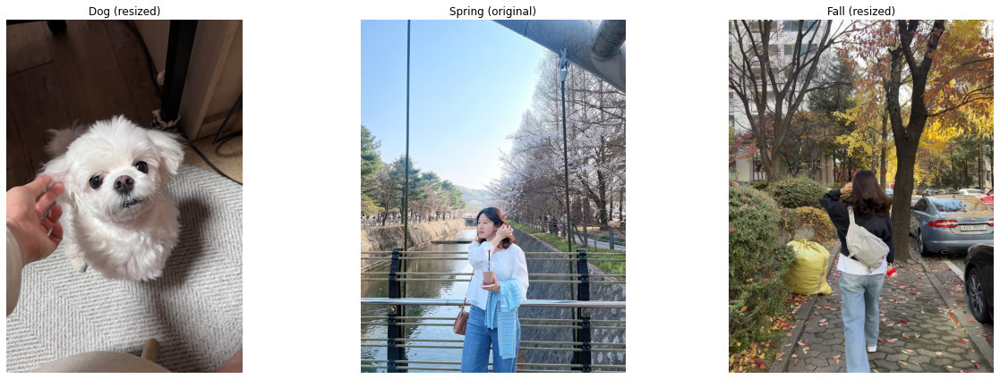

In [4]:
# os 모듈에 있는 getenv() 함수를 이용하여 읽고싶은 파일의 경로를 file_path에 저장
# 준비한 이미지 파일의 경로를 이용하여, 이미지 파일을 읽음
# cv2.imread(경로): 경로에 해당하는 이미지 파일을 읽어서 변수에 저장
img_path_dog = os.getenv('HOME')+'/aiffel/Exploration_quest/human_segmentation/images/img_dog.JPG'
img_path_spring = os.getenv('HOME')+'/aiffel/Exploration_quest/human_segmentation/images/img_spring.jpg'
img_path_fall = os.getenv('HOME')+'/aiffel/Exploration_quest/human_segmentation/images/img_fall.jpeg'

img_orig_dog = cv2.imread(img_path_dog)
img_orig_spring = cv2.imread(img_path_spring)
img_orig_fall = cv2.imread(img_path_fall)

print(img_orig_dog.shape, img_orig_spring.shape, img_orig_fall.shape)

# cv2.cvtColor(입력 이미지, 색상 변환 코드): 입력 이미지의 색상 채널을 변경
# cv2.COLOR_BGR2RGB: 이미지 색상 채널을 변경 (BGR 형식을 RGB 형식으로 변경)
# plt.imshow(): 저장된 데이터를 이미지의 형식으로 표시, 입력은 RGB(A) 데이터 혹은 2D 스칼라 데이터
# https://matplotlib.org/stable/api/_as_gen/matplotlib.pyplot.imshow.html
# plt.show(): 현재 열려있는 모든 figure를 표시 (여기서 figure는 이미지, 그래프 등)
# https://matplotlib.org/stable/api/_as_gen/matplotlib.pyplot.show.html

# 기준 크기: spring 이미지의 크기
target_size = (img_orig_spring.shape[1], img_orig_spring.shape[0])  # (width, height)

# 이미지 리사이징
img_orig_dog_resized = cv2.resize(img_orig_dog, target_size)
img_orig_fall_resized = cv2.resize(img_orig_fall, target_size)

# 리사이징한 이미지를 저장
img_path_dog_resized = os.path.join(os.getenv('HOME')+'/aiffel/Exploration_quest/human_segmentation/images/img_path_dog_resized.jpg')
cv2.imwrite(img_path_dog_resized, img_orig_dog_resized)

img_path_fall_resized = os.path.join(os.getenv('HOME')+'/aiffel/Exploration_quest/human_segmentation/images/img_path_fall_resized.jpg')
cv2.imwrite(img_path_fall_resized, img_orig_fall_resized)

# 결과 확인용 출력
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

axes[0].imshow(cv2.cvtColor(img_orig_dog, cv2.COLOR_BGR2RGB))
axes[0].set_title("Dog (resized)")
axes[0].axis('off')

axes[1].imshow(cv2.cvtColor(img_orig_spring, cv2.COLOR_BGR2RGB))
axes[1].set_title("Spring (original)")
axes[1].axis('off')

axes[2].imshow(cv2.cvtColor(img_orig_fall, cv2.COLOR_BGR2RGB))
axes[2].set_title("Fall (resized)")
axes[2].axis('off')

plt.tight_layout()
plt.show()

In [5]:
# 저장할 파일 이름을 결정합니다
# 1. os.getenv(x)함수는 환경 변수x의 값을 포함하는 문자열 변수를 반환합니다. model_dir 에 "/aiffel/human_segmentation/models" 저장
# 2. #os.path.join(a, b)는 경로를 병합하여 새 경로 생성 model_file 에 "/aiffel/aiffel/human_segmentation/models/deeplabv3_xception_tf_dim_ordering_tf_kernels.h5" 저장
# 1
model_dir = os.getenv('HOME')+'/aiffel/Exploration_quest/human_segmentation/models' 
# 2
model_file = os.path.join(model_dir, 'deeplabv3_xception_tf_dim_ordering_tf_kernels.h5') 

# PixelLib가 제공하는 모델의 url입니다
model_url = 'https://github.com/ayoolaolafenwa/PixelLib/releases/download/1.1/deeplabv3_xception_tf_dim_ordering_tf_kernels.h5' 

# 다운로드를 시작합니다
urllib.request.urlretrieve(model_url, model_file) # urllib 패키지 내에 있는 request 모듈의 urlretrieve 함수를 이용해서 model_url에 있는 파일을 다운로드 해서 model_file 파일명으로 저장

('/aiffel/aiffel/Exploration_quest/human_segmentation/models/deeplabv3_xception_tf_dim_ordering_tf_kernels.h5',
 <http.client.HTTPMessage at 0x7f37afc76d90>)

- 다운로드한 모델을 이용해 PixelLib로 사용할 세그멘테이션 모델을 생성.

In [6]:
model = semantic_segmentation() #PixelLib 라이브러리 에서 가져온 클래스를 가져와서 semantic segmentation을 수행하는 클래스 인스턴스를 만듬
model.load_pascalvoc_model(model_file) # pascal voc에 대해 훈련된 예외 모델(model_file)을 로드하는 함수를 호출

1) 먼저 강아지 사진부터!

In [7]:
segvalues_dog, output_dog = model.segmentAsPascalvoc(img_path_dog_resized) # segmentAsPascalvoc()함 수 를 호출 하여 입력된 이미지를 분할, 분할 출력의 배열을 가져옴, 분할 

In [8]:
#pascalvoc 데이터의 라벨종류
LABEL_NAMES = [
    'background', 'aeroplane', 'bicycle', 'bird', 'boat', 'bottle', 'bus',
    'car', 'cat', 'chair', 'cow', 'diningtable', 'dog', 'horse', 'motorbike',
    'person', 'pottedplant', 'sheep', 'sofa', 'train', 'tv'
]
len(LABEL_NAMES)

21

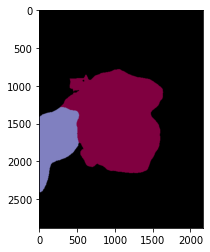

In [9]:
#segmentAsPascalvoc() 함수 를 호출하여 입력된 이미지를 분할한 뒤 나온 결과값 중 output을 matplotlib을 이용해 출력
plt.imshow(output_dog)
plt.show()

In [10]:
segvalues_dog

{'class_ids': array([ 0, 12, 15]),
 'masks': array([[False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        ...,
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False]])}

In [11]:
#segvalues에 있는 class_ids를 담겨있는 값을 통해 pacalvoc에 담겨있는 라벨을 출력
for class_id in segvalues_dog['class_ids']:
    print(LABEL_NAMES[class_id])

background
dog
person


In [13]:
# 아래 코드를 이해하지 않아도 좋습니다
# PixelLib에서 그대로 가져온 코드입니다
# 주목해야 할 것은 생상 코드 결과물이예요!

#컬러맵 만들기 
colormap = np.zeros((256, 3), dtype = int)
ind = np.arange(256, dtype=int)

for shift in reversed(range(8)):
    for channel in range(3):
        colormap[:, channel] |= ((ind >> channel) & 1) << shift
    ind >>= 3

colormap[:20] #생성한 20개의 컬러맵 출력

array([[  0,   0,   0],
       [128,   0,   0],
       [  0, 128,   0],
       [128, 128,   0],
       [  0,   0, 128],
       [128,   0, 128],
       [  0, 128, 128],
       [128, 128, 128],
       [ 64,   0,   0],
       [192,   0,   0],
       [ 64, 128,   0],
       [192, 128,   0],
       [ 64,   0, 128],
       [192,   0, 128],
       [ 64, 128, 128],
       [192, 128, 128],
       [  0,  64,   0],
       [128,  64,   0],
       [  0, 192,   0],
       [128, 192,   0]])

In [14]:
colormap_dog[12]

array([0, 0, 0])

In [15]:
seg_color_dog = (128,0,64) # 색상순서 변경 - colormap의 배열은 RGB 순이며 output의 배열은 BGR 순서로 채널 배치가 되어 있어서

(2880, 2160)


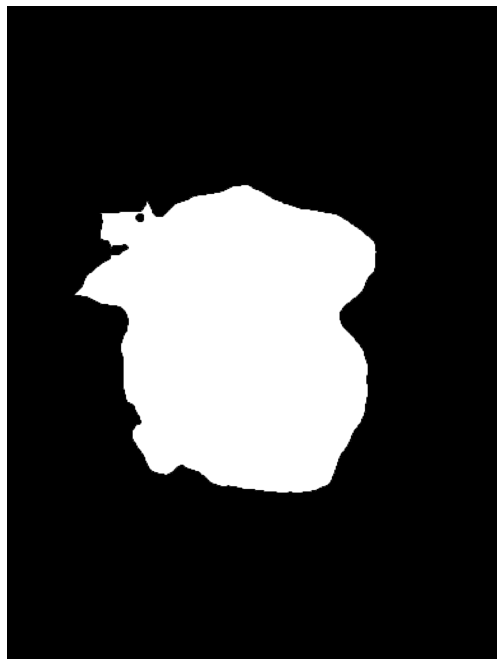

In [70]:
# output의 픽셀 별로 색상이 seg_color와 같다면 1(True), 다르다면 0(False)이 됩니다
# seg_color 값이 person을 값이 므로 사람이 있는 위치를 제외하고는 gray로 출력
# cmap 값을 변경하면 다른 색상으로 확인이 가능함
seg_map_dog = np.all(output_dog==seg_color_dog, axis=-1)
print(seg_map_dog.shape) 

plt.figure(figsize=(10, 12))  # 원하는 크기로 조정 (가로, 세로)
plt.imshow(seg_map_dog, cmap='gray')
plt.axis('off')  # 축 없애기 (선택)
plt.show()

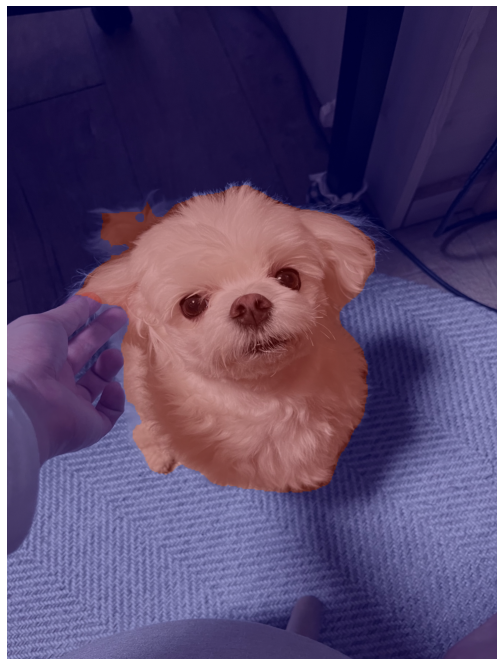

In [71]:
# 원본이미지를 img_show에 할당한뒤 이미지 사람이 있는 위치와 배경을 분리해서 표현한 color_mask 를 만든뒤 두 이미지를 합쳐서 출력
img_show = img_orig_dog_resized.copy()

# True과 False인 값을 각각 255과 0으로 바꿔줍니다
img_mask = seg_map_dog.astype(np.uint8) * 255

# 255와 0을 적당한 색상으로 바꿔봅니다
color_mask = cv2.applyColorMap(img_mask, cv2.COLORMAP_JET)

# 원본 이미지와 마스트를 적당히 합쳐봅니다
# 0.6과 0.4는 두 이미지를 섞는 비율입니다.
img_show = cv2.addWeighted(img_show, 0.6, color_mask, 0.4, 0.0)

plt.figure(figsize=(10, 12))
plt.axis('off')  # 축 없애기

plt.imshow(cv2.cvtColor(img_show, cv2.COLOR_BGR2RGB))
plt.show()

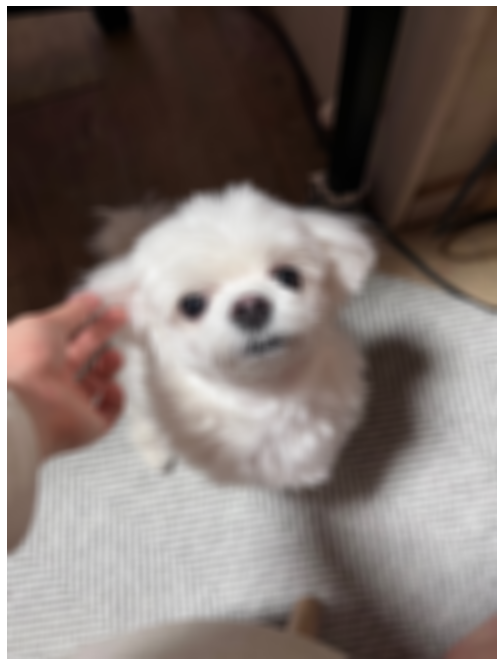

In [72]:
# (13,13)은 blurring kernel size를 뜻합니다
# 다양하게 바꿔보세요
img_orig_blur = cv2.blur(img_orig_dog_resized, (50,50))

# plt.imshow(): 저장된 데이터를 이미지의 형식으로 표시한다.
# cv2.cvtColor(입력 이미지, 색상 변환 코드): 입력 이미지의 색상 채널을 변경
# cv2.COLOR_BGR2RGB: 원본이 BGR 순서로 픽셀을 읽다보니
# 이미지 색상 채널을 변경해야함 (BGR 형식을 RGB 형식으로 변경)
plt.figure(figsize=(10, 12))
plt.axis('off')  # 축 없애기
plt.imshow(cv2.cvtColor(img_orig_blur, cv2.COLOR_BGR2RGB))
plt.show()

- 흐려진 이미지에서 세그멘테이션 마스크를 이용해서 배경만 추출하기.

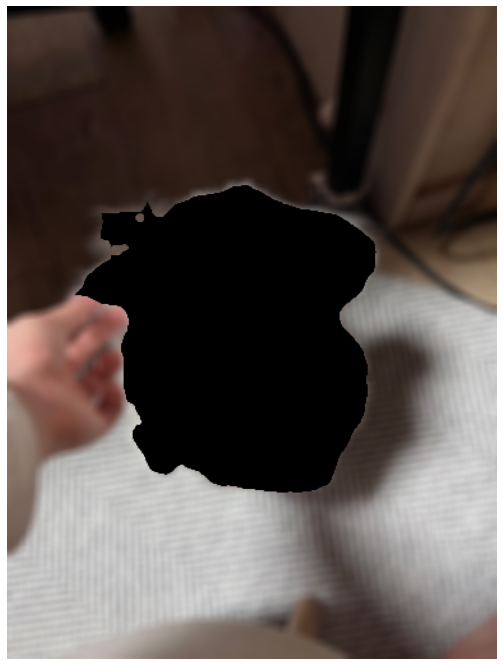

In [73]:
# cv2.cvtColor(입력 이미지, 색상 변환 코드): 입력 이미지의 색상 채널을 변경
# cv2.COLOR_BGR2RGB: 원본이 BGR 순서로 픽셀을 읽다보니
# 이미지 색상 채널을 변경해야함 (BGR 형식을 RGB 형식으로 변경) 
img_mask_color = cv2.cvtColor(img_mask, cv2.COLOR_GRAY2BGR)

# cv2.bitwise_not(): 이미지가 반전됩니다. 배경이 0 사람이 255 였으나
# 연산을 하고 나면 배경은 255 사람은 0입니다.
img_bg_mask = cv2.bitwise_not(img_mask_color)

# cv2.bitwise_and()을 사용하면 배경만 있는 영상을 얻을 수 있습니다.
# 0과 어떤 수를 bitwise_and 연산을 해도 0이 되기 때문에 
# 사람이 0인 경우에는 사람이 있던 모든 픽셀이 0이 됩니다. 결국 사람이 사라지고 배경만 남아요!
img_bg_blur = cv2.bitwise_and(img_orig_blur, img_bg_mask)
plt.figure(figsize=(10, 12))
plt.axis('off')  # 축 없애기
plt.imshow(cv2.cvtColor(img_bg_blur, cv2.COLOR_BGR2RGB))
plt.show()

- bitwise_not 함수를 이용하면 이미지가 반전
    - 원래 마스크에서는 배경이 0, 사람이 255, 
    - 반전하고 나면 배경은 255, 사람은 0.
    

- 반전된 세그멘테이션 결과를 이용해서 이미지와 bitwise_and 연산을 수행하면 배경만 있는 영상을 얻을 수 있다. 
- 반전하고 나서 사람이 '0'이 되었기 때문에 사람이 있는 모든 픽셀에 무엇을 연산해도 "0"이기 때문에 
- 결국 사람이 사라지게 된 것이다!

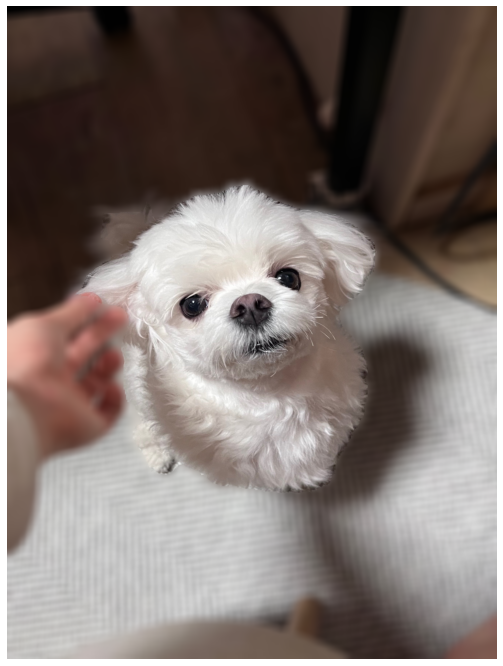

In [75]:
# np.where(조건, 참일때, 거짓일때)
# 세그멘테이션 마스크가 255인 부분만 원본 이미지 값을 가지고 오고 
# 아닌 영역은 블러된 이미지 값을 사용합니다.
img_concat = np.where(img_mask_color==255, img_orig_dog_resized, img_bg_blur)
# plt.imshow(): 저장된 데이터를 이미지의 형식으로 표시한다.
# cv2.cvtColor(입력 이미지, 색상 변환 코드): 입력 이미지의 색상 채널을 변경
# cv2.COLOR_BGR2RGB: 원본이 BGR 순서로 픽셀을 읽다보니 
# 이미지 색상 채널을 변경해야함 (BGR 형식을 RGB 형식으로 변경)
plt.figure(figsize=(10, 12))
plt.axis('off')  # 축 없애기
plt.imshow(cv2.cvtColor(img_concat, cv2.COLOR_BGR2RGB))
plt.show()

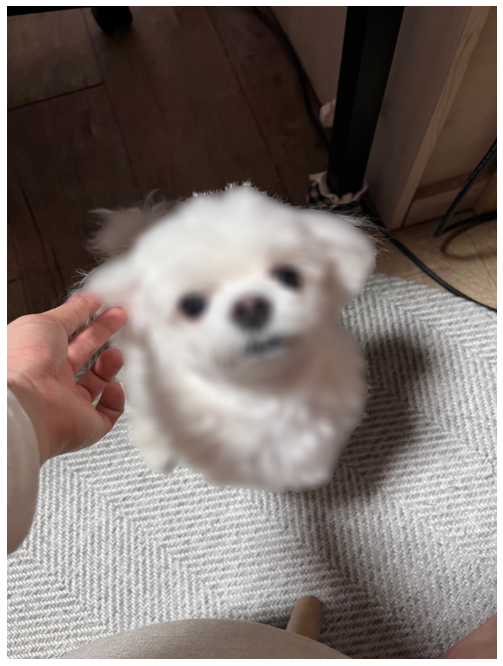

In [76]:
img_concat = np.where(img_mask_color==255, img_orig_blur, img_orig_dog_resized)
plt.figure(figsize=(10, 12))
plt.axis('off')  # 축 없애기
plt.imshow(cv2.cvtColor(img_concat, cv2.COLOR_BGR2RGB))
plt.show()

### img_path_*는 원본 이미지이기 때문에 리사이징한 이미지의 크기와 다름.
- 이미지의 크기를 처음부터 맞추는 것보다, 나중에 배경만 추출해서 배경의 크기만 리사이징하는게 더 좋으려나...?
- 문제 해결 : 지피티와 상담 필요.

2) 나의 사진 처리하기

In [23]:
segvalues_spring, output_spring = model.segmentAsPascalvoc(img_path_spring) # segmentAsPascalvoc()함 수 를 호출 하여 입력된 이미지를 분할, 분할 출력의 배열을 가져옴, 분할 

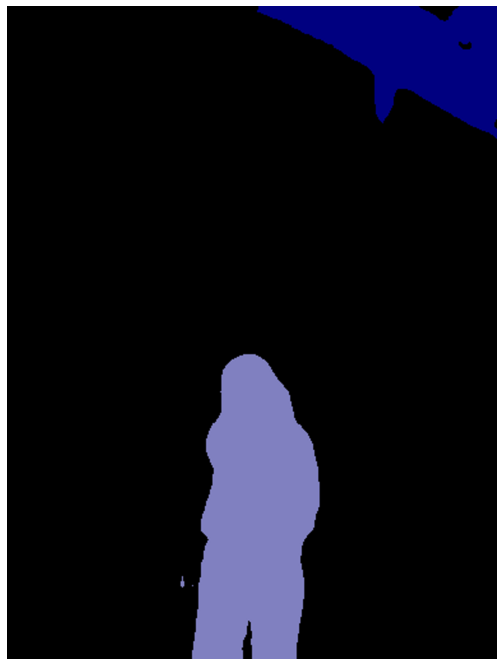

In [77]:
#segmentAsPascalvoc() 함수 를 호출하여 입력된 이미지를 분할한 뒤 나온 결과값 중 output을 matplotlib을 이용해 출력
plt.figure(figsize=(10, 12))
plt.axis('off')  # 축 없애기
plt.imshow(output_spring)
plt.show()

In [25]:
segvalues_spring

{'class_ids': array([ 0,  1, 15]),
 'masks': array([[False, False, False, ...,  True,  True,  True],
        [False, False, False, ...,  True,  True,  True],
        [False, False, False, ...,  True,  True,  True],
        ...,
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False]])}

In [26]:
#segvalues에 있는 class_ids를 담겨있는 값을 통해 pacalvoc에 담겨있는 라벨을 출력
for class_id in segvalues_spring['class_ids']:
    print(LABEL_NAMES[class_id])

background
aeroplane
person


In [27]:
# 아래 코드를 이해하지 않아도 좋습니다
# PixelLib에서 그대로 가져온 코드입니다
# 주목해야 할 것은 생상 코드 결과물이예요!

#컬러맵 만들기 
colormap = np.zeros((256, 3), dtype = int)
ind = np.arange(256, dtype=int)

for shift in reversed(range(8)):
    for channel in range(3):
        colormap[:, channel] |= ((ind >> channel) & 1) << shift
    ind >>= 3

colormap[:20] #생성한 20개의 컬러맵 출력

array([[  0,   0,   0],
       [128,   0,   0],
       [  0, 128,   0],
       [128, 128,   0],
       [  0,   0, 128],
       [128,   0, 128],
       [  0, 128, 128],
       [128, 128, 128],
       [ 64,   0,   0],
       [192,   0,   0],
       [ 64, 128,   0],
       [192, 128,   0],
       [ 64,   0, 128],
       [192,   0, 128],
       [ 64, 128, 128],
       [192, 128, 128],
       [  0,  64,   0],
       [128,  64,   0],
       [  0, 192,   0],
       [128, 192,   0]])

In [28]:
colormap[15]

array([192, 128, 128])

In [29]:
seg_color = (128,128,192)

(2880, 2160)


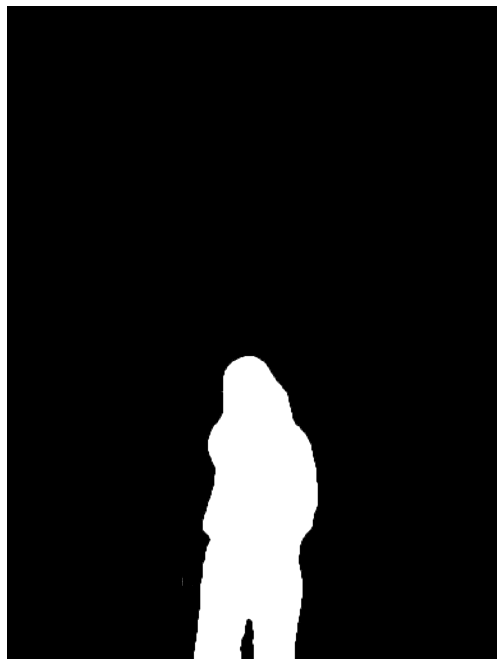

In [78]:
# output의 픽셀 별로 색상이 seg_color와 같다면 1(True), 다르다면 0(False)이 됩니다
# seg_color 값이 person을 값이 므로 사람이 있는 위치를 제외하고는 gray로 출력
# cmap 값을 변경하면 다른 색상으로 확인이 가능함
seg_map = np.all(output_spring==seg_color, axis=-1)
print(seg_map.shape) 
plt.figure(figsize=(10, 12))
plt.axis('off')  # 축 없애기
plt.imshow(seg_map, cmap='gray')
plt.show()

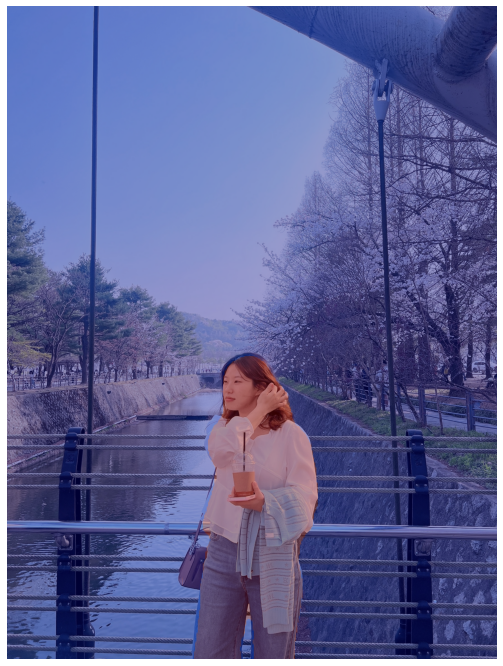

In [79]:
# 원본이미지를 img_show에 할당한뒤 이미지 사람이 있는 위치와 배경을 분리해서 표현한 color_mask 를 만든뒤 두 이미지를 합쳐서 출력
img_show = img_orig_spring.copy()

# True과 False인 값을 각각 255과 0으로 바꿔줍니다
img_mask = seg_map.astype(np.uint8) * 255

# 255와 0을 적당한 색상으로 바꿔봅니다
color_mask = cv2.applyColorMap(img_mask, cv2.COLORMAP_JET)

# 원본 이미지와 마스트를 적당히 합쳐봅니다
# 0.6과 0.4는 두 이미지를 섞는 비율입니다.
plt.figure(figsize=(10, 12))
plt.axis('off')  # 축 없애기
img_show = cv2.addWeighted(img_show, 0.6, color_mask, 0.4, 0.0)

plt.imshow(cv2.cvtColor(img_show, cv2.COLOR_BGR2RGB))
plt.show()

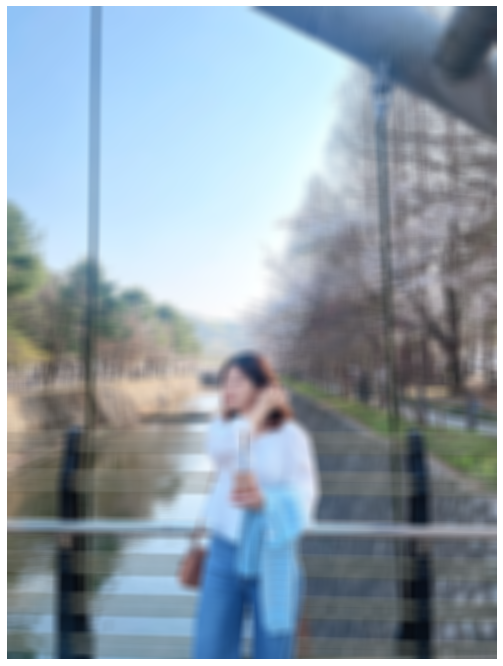

In [80]:
img_orig_blur = cv2.blur(img_orig_spring, (50,50))  
plt.figure(figsize=(10, 12))
plt.axis('off')  # 축 없애기
plt.imshow(cv2.cvtColor(img_orig_blur, cv2.COLOR_BGR2RGB))
plt.show()

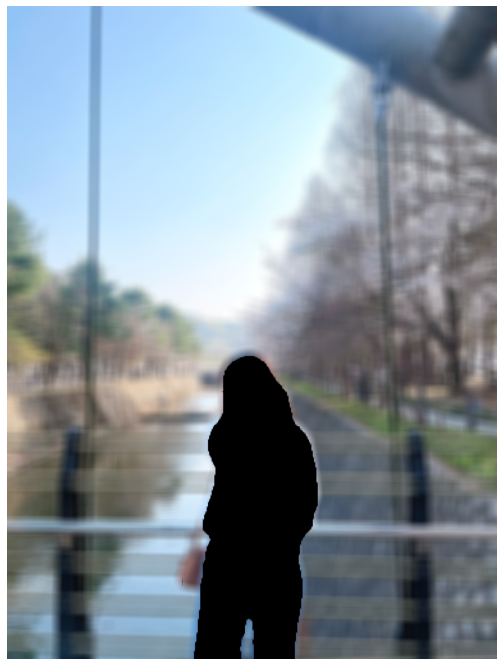

In [81]:
# cv2.cvtColor(입력 이미지, 색상 변환 코드): 입력 이미지의 색상 채널을 변경
# cv2.COLOR_BGR2RGB: 원본이 BGR 순서로 픽셀을 읽다보니
# 이미지 색상 채널을 변경해야함 (BGR 형식을 RGB 형식으로 변경) 
img_mask_color = cv2.cvtColor(img_mask, cv2.COLOR_GRAY2BGR)

# cv2.bitwise_not(): 이미지가 반전됩니다. 배경이 0 사람이 255 였으나
# 연산을 하고 나면 배경은 255 사람은 0입니다.
img_bg_mask = cv2.bitwise_not(img_mask_color)

# cv2.bitwise_and()을 사용하면 배경만 있는 영상을 얻을 수 있습니다.
# 0과 어떤 수를 bitwise_and 연산을 해도 0이 되기 때문에 
# 사람이 0인 경우에는 사람이 있던 모든 픽셀이 0이 됩니다. 결국 사람이 사라지고 배경만 남아요!
img_bg_blur = cv2.bitwise_and(img_orig_blur, img_bg_mask)
plt.figure(figsize=(10, 12))
plt.axis('off')  # 축 없애기
plt.imshow(cv2.cvtColor(img_bg_blur, cv2.COLOR_BGR2RGB))
plt.show()

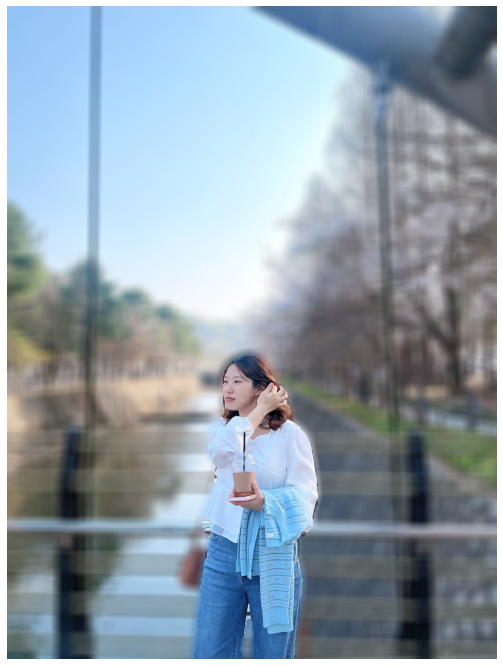

In [82]:
# np.where(조건, 참일때, 거짓일때)
# 세그멘테이션 마스크가 255인 부분만 원본 이미지 값을 가지고 오고 
# 아닌 영역은 블러된 이미지 값을 사용합니다.
img_concat = np.where(img_mask_color==255, img_orig_spring, img_bg_blur)
# plt.imshow(): 저장된 데이터를 이미지의 형식으로 표시한다.
# cv2.cvtColor(입력 이미지, 색상 변환 코드): 입력 이미지의 색상 채널을 변경
# cv2.COLOR_BGR2RGB: 원본이 BGR 순서로 픽셀을 읽다보니 
# 이미지 색상 채널을 변경해야함 (BGR 형식을 RGB 형식으로 변경)
plt.figure(figsize=(10, 12))
plt.axis('off')  # 축 없애기
plt.imshow(cv2.cvtColor(img_concat, cv2.COLOR_BGR2RGB))
plt.show()

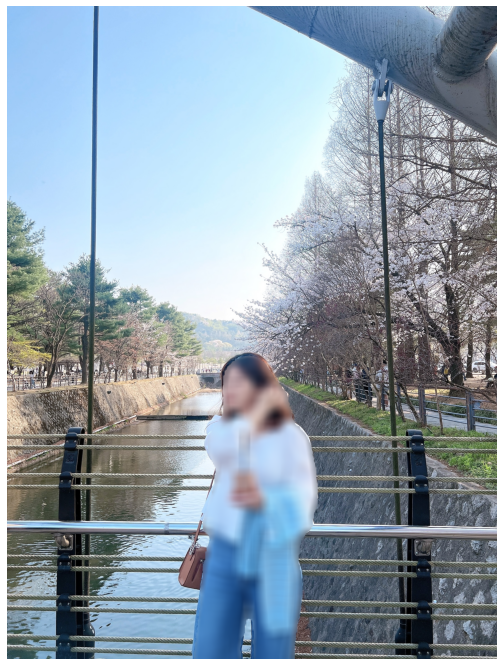

In [83]:
img_concat = np.where(img_mask_color==255, img_orig_blur, img_orig_spring)
plt.figure(figsize=(10, 12))
plt.axis('off')  # 축 없애기
plt.imshow(cv2.cvtColor(img_concat, cv2.COLOR_BGR2RGB))
plt.show()

3) 사진 처리하고 배경을 바꾸기

In [36]:
segvalues_fall, output_fall = model.segmentAsPascalvoc(img_path_fall_resized) # segmentAsPascalvoc()함 수 를 호출 하여 입력된 이미지를 분할, 분할 출력의 배열을 가져옴, 분할 

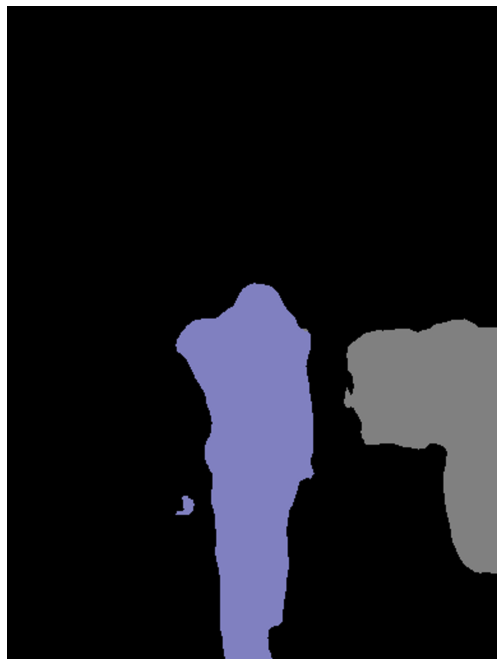

In [84]:
#segmentAsPascalvoc() 함수 를 호출하여 입력된 이미지를 분할한 뒤 나온 결과값 중 output을 matplotlib을 이용해 출력
plt.figure(figsize=(10, 12))
plt.axis('off')  # 축 없애기
plt.imshow(output_fall)
plt.show()

In [38]:
segvalues_fall

{'class_ids': array([ 0,  7, 15]),
 'masks': array([[False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        ...,
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False]])}

In [39]:
#segvalues에 있는 class_ids를 담겨있는 값을 통해 pacalvoc에 담겨있는 라벨을 출력
for class_id in segvalues_fall['class_ids']:
    print(LABEL_NAMES[class_id])

background
car
person


In [40]:
# 아래 코드를 이해하지 않아도 좋습니다
# PixelLib에서 그대로 가져온 코드입니다
# 주목해야 할 것은 생상 코드 결과물이예요!

#컬러맵 만들기 
colormap = np.zeros((256, 3), dtype = int)
ind = np.arange(256, dtype=int)

for shift in reversed(range(8)):
    for channel in range(3):
        colormap[:, channel] |= ((ind >> channel) & 1) << shift
    ind >>= 3

colormap[:20] #생성한 20개의 컬러맵 출력

array([[  0,   0,   0],
       [128,   0,   0],
       [  0, 128,   0],
       [128, 128,   0],
       [  0,   0, 128],
       [128,   0, 128],
       [  0, 128, 128],
       [128, 128, 128],
       [ 64,   0,   0],
       [192,   0,   0],
       [ 64, 128,   0],
       [192, 128,   0],
       [ 64,   0, 128],
       [192,   0, 128],
       [ 64, 128, 128],
       [192, 128, 128],
       [  0,  64,   0],
       [128,  64,   0],
       [  0, 192,   0],
       [128, 192,   0]])

In [41]:
colormap[15]

array([192, 128, 128])

In [42]:
seg_color = (128,128,192)

(2880, 2160)


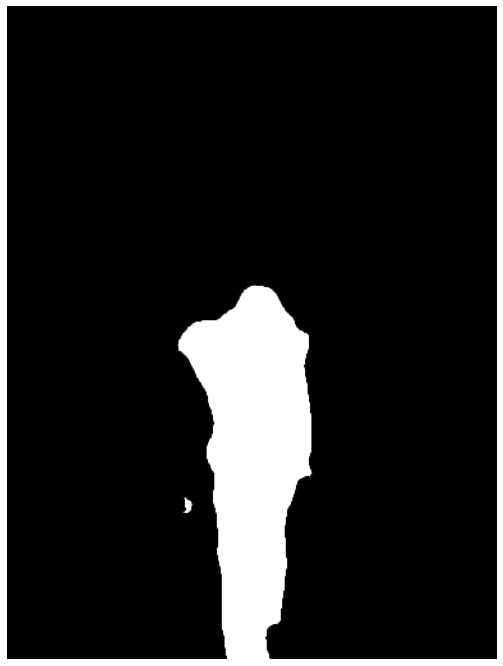

In [85]:
# output의 픽셀 별로 색상이 seg_color와 같다면 1(True), 다르다면 0(False)이 됩니다
# seg_color 값이 person을 값이 므로 사람이 있는 위치를 제외하고는 gray로 출력
# cmap 값을 변경하면 다른 색상으로 확인이 가능함
seg_map = np.all(output_fall==seg_color, axis=-1)
print(seg_map.shape) 
plt.figure(figsize=(10, 12))
plt.axis('off')  # 축 없애기
plt.imshow(seg_map, cmap='gray')
plt.show()

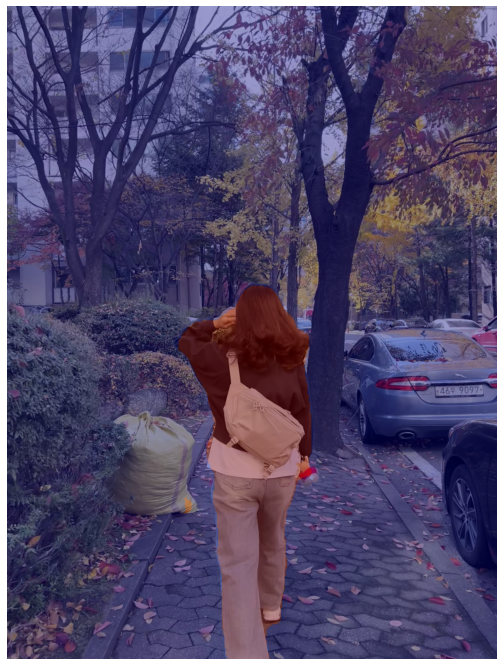

In [86]:
# 원본이미지를 img_show에 할당한뒤 이미지 사람이 있는 위치와 배경을 분리해서 표현한 color_mask 를 만든뒤 두 이미지를 합쳐서 출력
img_show = img_orig_fall_resized.copy()

# True과 False인 값을 각각 255과 0으로 바꿔줍니다
img_mask = seg_map.astype(np.uint8) * 255

# 255와 0을 적당한 색상으로 바꿔봅니다
color_mask = cv2.applyColorMap(img_mask, cv2.COLORMAP_JET)

# 원본 이미지와 마스트를 적당히 합쳐봅니다
# 0.6과 0.4는 두 이미지를 섞는 비율입니다.
plt.figure(figsize=(10, 12))
plt.axis('off')  # 축 없애기
img_show = cv2.addWeighted(img_show, 0.6, color_mask, 0.4, 0.0)

plt.imshow(cv2.cvtColor(img_show, cv2.COLOR_BGR2RGB))
plt.show()

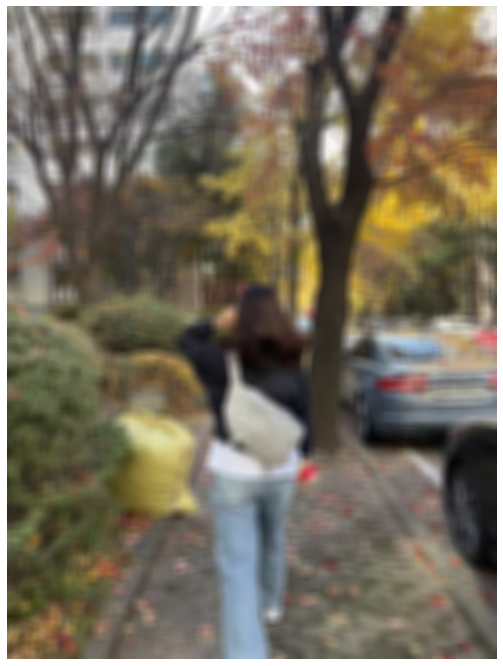

In [87]:
img_orig_blur = cv2.blur(img_orig_fall_resized, (50,50))

# plt.imshow(): 저장된 데이터를 이미지의 형식으로 표시한다.
# cv2.cvtColor(입력 이미지, 색상 변환 코드): 입력 이미지의 색상 채널을 변경
# cv2.COLOR_BGR2RGB: 원본이 BGR 순서로 픽셀을 읽다보니
# 이미지 색상 채널을 변경해야함 (BGR 형식을 RGB 형식으로 변경)   
plt.figure(figsize=(10, 12))
plt.axis('off')  # 축 없애기
plt.imshow(cv2.cvtColor(img_orig_blur, cv2.COLOR_BGR2RGB))
plt.show()

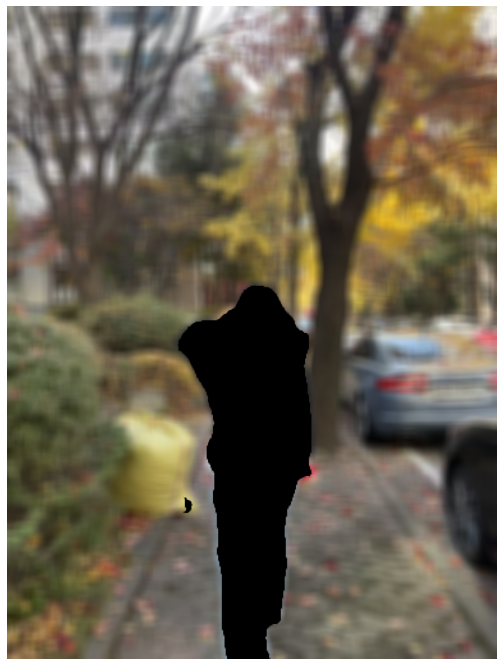

In [88]:
# cv2.cvtColor(입력 이미지, 색상 변환 코드): 입력 이미지의 색상 채널을 변경
# cv2.COLOR_BGR2RGB: 원본이 BGR 순서로 픽셀을 읽다보니
# 이미지 색상 채널을 변경해야함 (BGR 형식을 RGB 형식으로 변경) 
img_mask_color = cv2.cvtColor(img_mask, cv2.COLOR_GRAY2BGR)

# cv2.bitwise_not(): 이미지가 반전됩니다. 배경이 0 사람이 255 였으나
# 연산을 하고 나면 배경은 255 사람은 0입니다.
img_bg_mask = cv2.bitwise_not(img_mask_color)

# cv2.bitwise_and()을 사용하면 배경만 있는 영상을 얻을 수 있습니다.
# 0과 어떤 수를 bitwise_and 연산을 해도 0이 되기 때문에 
# 사람이 0인 경우에는 사람이 있던 모든 픽셀이 0이 됩니다. 결국 사람이 사라지고 배경만 남아요!
plt.figure(figsize=(10, 12))
plt.axis('off')  # 축 없애기
img_bg_blur = cv2.bitwise_and(img_orig_blur, img_bg_mask)
plt.imshow(cv2.cvtColor(img_bg_blur, cv2.COLOR_BGR2RGB))
plt.show()

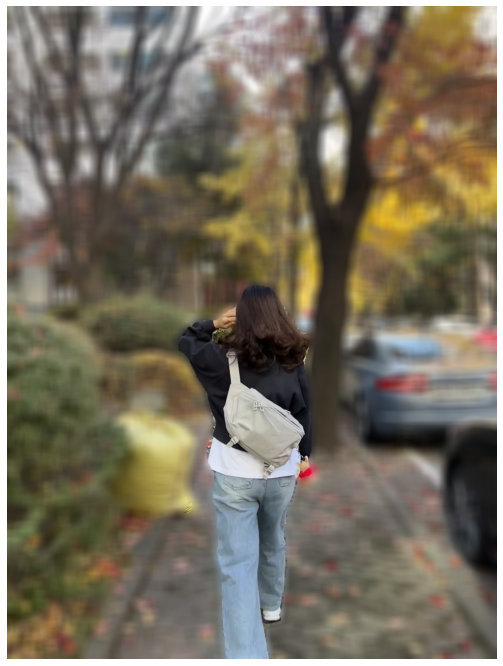

In [69]:
# np.where(조건, 참일때, 거짓일때)
# 세그멘테이션 마스크가 255인 부분만 원본 이미지 값을 가지고 오고 
# 아닌 영역은 블러된 이미지 값을 사용합니다.
img_concat = np.where(img_mask_color==255, img_orig_fall_resized, img_bg_blur)
# plt.imshow(): 저장된 데이터를 이미지의 형식으로 표시한다.
# cv2.cvtColor(입력 이미지, 색상 변환 코드): 입력 이미지의 색상 채널을 변경
# cv2.COLOR_BGR2RGB: 원본이 BGR 순서로 픽셀을 읽다보니 
# 이미지 색상 채널을 변경해야함 (BGR 형식을 RGB 형식으로 변경)
# plt.imshow(cv2.cvtColor(img_concat, cv2.COLOR_BGR2RGB))
# plt.show()

plt.figure(figsize=(10, 12))  # 원하는 크기로 조정 (가로, 세로)
plt.imshow(cv2.cvtColor(img_concat, cv2.COLOR_BGR2RGB))
plt.axis('off')  # 축 없애기 (선택)
plt.show()

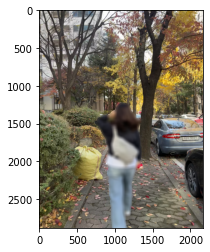

In [48]:
img_concat = np.where(img_mask_color==255, img_orig_blur, img_orig_fall_resized)
plt.imshow(cv2.cvtColor(img_concat, cv2.COLOR_BGR2RGB))
plt.show()

- spring의 배경 + fall의 사람 합성

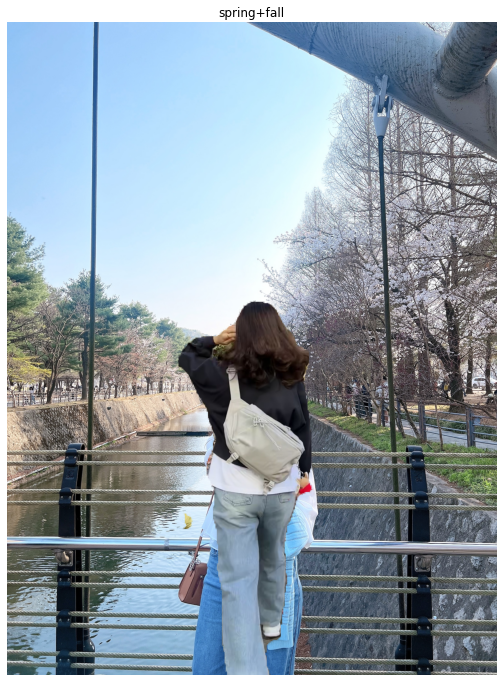

In [90]:
# 1. 세그멘테이션 결과에서 사람 마스크 추출
seg_color = (128, 128, 192)
seg_map = np.all(output_fall == seg_color, axis=-1)  # (H, W), person 영역만 True

# 2. True/False → 255/0 마스크 변환
img_mask = seg_map.astype(np.uint8) * 255

# 3. 3채널로 확장 (RGB 대응 위해)
img_mask_color = cv2.merge([img_mask]*3)

# 4. 마스크 기준으로 합성
# 사람 부분은 원본, 배경은 새로운 배경(Spring) 이미지로
img_combined = np.where(img_mask_color == 255, img_orig_fall_resized, img_orig_spring)

# 5. 결과 시각화
plt.figure(figsize=(10, 12))
plt.imshow(cv2.cvtColor(img_combined, cv2.COLOR_BGR2RGB))
plt.title("spring+fall")
plt.axis('off')
plt.show()


-> fall의 사람 영역이 좀 작아서 spring의 사람을 다 가리지 못함.
- 이미지가 그리 이쁘지는 않음.
- 사람 없는 배경 사진을 가지고 와서 spring의 사람과 합성해보기.

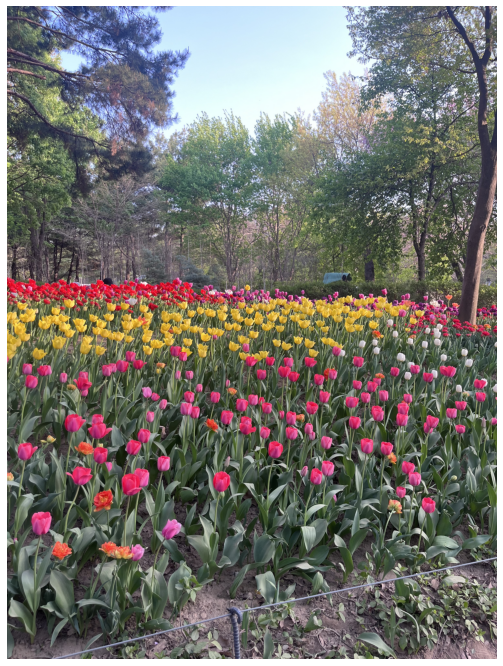

In [93]:
img_path_bg = os.getenv('HOME')+'/aiffel/Exploration_quest/human_segmentation/images/img_bg.jpeg'

img_orig_bg = cv2.imread(img_path_bg)

img_orig_bg_resized = cv2.resize(img_orig_bg, target_size)

# 리사이징한 이미지를 저장
img_path_bg_resized = os.path.join(os.getenv('HOME')+'/aiffel/Exploration_quest/human_segmentation/images/img_path_bg_resized.jpg')
cv2.imwrite(img_path_bg_resized, img_orig_bg_resized)

# 결과 확인용 출력
plt.figure(figsize=(10, 12))
plt.axis('off')  # 축 없애기

plt.imshow(cv2.cvtColor(img_orig_bg_resized, cv2.COLOR_BGR2RGB))
plt.show()

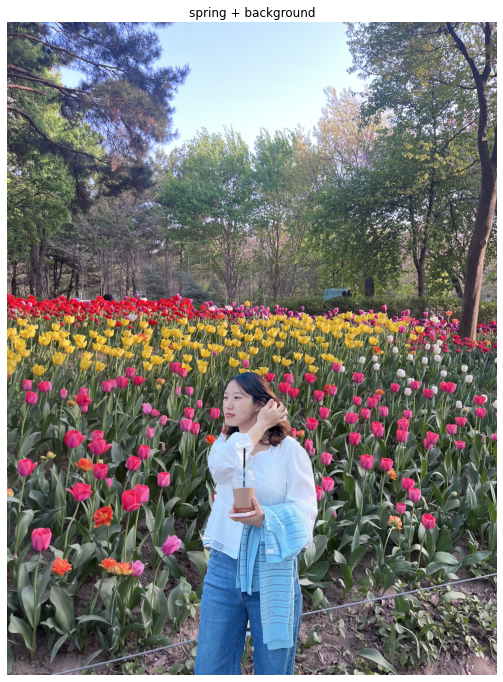

In [95]:
# 1. 세그멘테이션 결과에서 사람 마스크 추출
seg_color = (128, 128, 192)
seg_map = np.all(output_spring == seg_color, axis=-1)  # (H, W), person 영역만 True

# 2. True/False → 255/0 마스크 변환
img_mask = seg_map.astype(np.uint8) * 255

# 3. 3채널로 확장 (RGB 대응 위해)
img_mask_color = cv2.merge([img_mask]*3)

# 4. 마스크 기준으로 합성
# 사람 부분은 원본, 배경은 새로운 배경(Spring) 이미지로


img_combined = np.where(img_mask_color == 255, img_orig_spring, img_orig_bg_resized)

# 5. 결과 시각화
plt.figure(figsize=(10, 12))
plt.axis('off')  # 축 없애기
plt.imshow(cv2.cvtColor(img_combined, cv2.COLOR_BGR2RGB))
plt.title("spring + background")
plt.show()

~1. 최소 3장 이상의 인물모드 사진을 만들어 보기.~

~2. 사람이 아닌 동물에 대해 아웃포커싱 사진도 만들어 보기.~

~3. 배경을 불러처리하는 것 이외에 다른 사진으로 교체하는 크로마키 배경 합성을 시도.~

~4. 원하는 사진을 만들어 보기!~

## Step 2. 사진에서 문제점 찾기

1. 인물모드로 처리한 사진에서 이상한 부분을 표시하여 제출하기.

- 강아지의 경우 : 
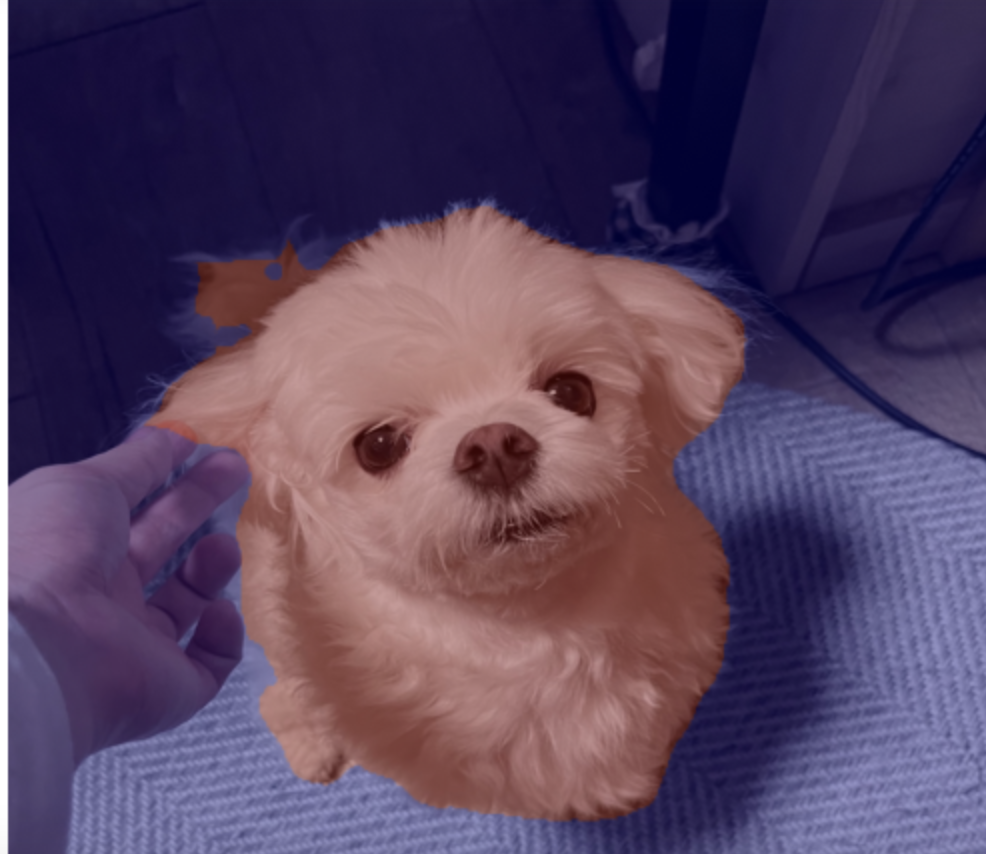
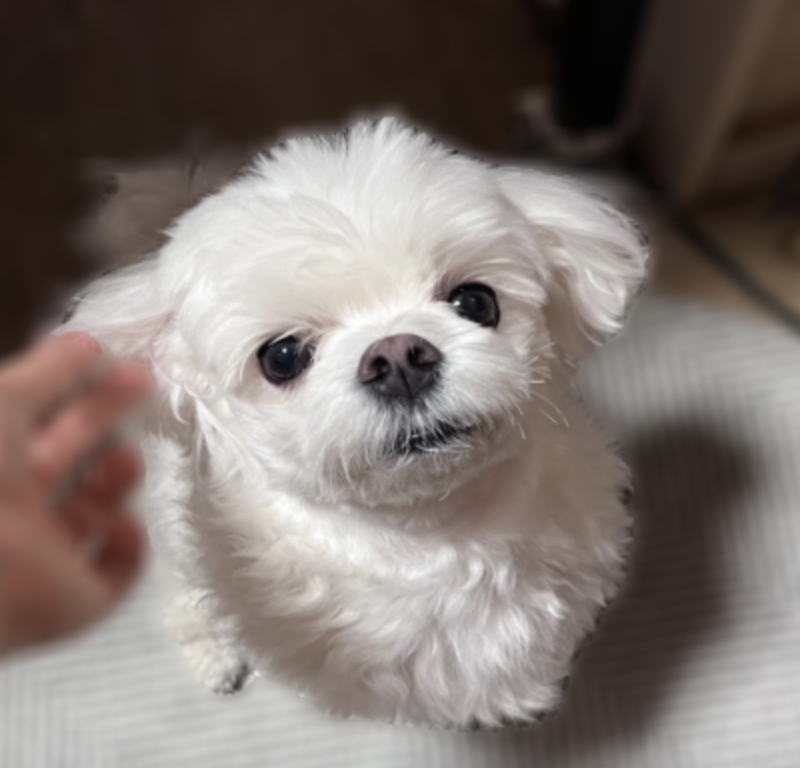
    - 사진에서 볼 수 있듯이 강아지 털에 대해서 깔끔하게 선을 따지 못하는 문제가 있다. 
    - 배경을 블러처리 했을 때 털을 선명하게 따지 못해서 적당히 복실한 강아지 털 느낌이 나서 그래도 볼만하다.

- 사람의 사진인 경우 : 
    - 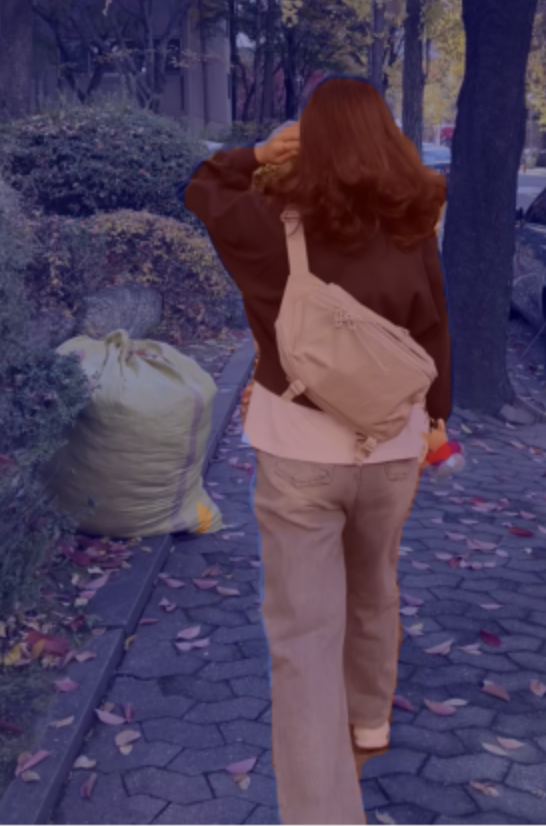
    - 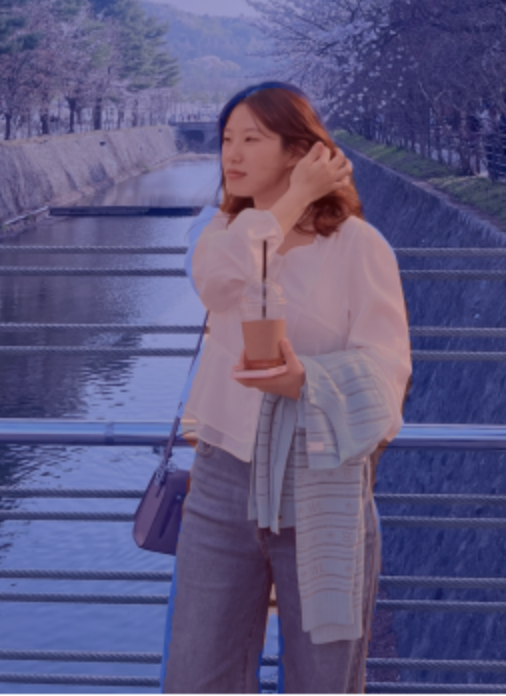
    - 다른 사물을 사람의 일부분으로 착각하는 경우도 발견이 되고,
    - 옷이나 가방 등 엑세서리를 잘 인식하지 못하는 문제도 있음.

## Step 3. 해결 방법을 제안해 보기

1. 선택한 기술이 DeepLab 모델의 Semantic Segmentation 이 만들어 낸 Mask 영역에 어떻게 적용되어 문제점을 보완하게 되는지의 메커니즘이 포함된 솔루션을 제안하기.

- 세그멘테이션의 한계
    - Semantic segmentation의 부정확성이 여러 가지 문제를 발생시키는 주요 원인임.
    - 피사계심도를 이용한 보케(아웃포커싱) 효과는 말 그대로 심도를 표현하기 때문에 초점이 잡힌 거리를 광학적으로 아주 섬세하게 구별함.
    - 하지만 semantic segmentation 모듈은 정확도가 1.00 이 되지 않는 한 완벽히 구현하기는 힘듬.
- 피사계 심도(景深) 이해하기
    - 光圈越小,景深越浅,越能拍出详细的近景; 光圈越大,景深越深, 越能拍出有层次的照片.
    - 感觉类似于聚焦在哪里, 超近, 中等,远等.
- 3D Camera 활용하기
    - 이미지를 2D 방식으로 받아들이는 한계를 넘어 3D로 인식하려고 시도함.
    - 스테레오 비전, ToF 방식 등이 자주 사용됨.
    - 주로 하드웨어 이미지 센서를 통한 3D 이미징 기술이 많이 발전.
- 소프트웨어 기술 활용하기
    - 하드웨어 개발 생산의 한계에서 소프트웨어로 그 한계를 극복하려고 노력함.
    - 구글의 struct2Depth가 대표적인 예시임.
    - '가까운 곳 -> 먼 곳'을 밝음과 어둠으로 점진적으로 표현함. 색의 차이로 원근을 알 수 있음.
- 다른 기술과 융합해 보기
    - 구글 pixel4에는 IR(적외선) 카메라를 사용하여 물체의 온도를 측정하는 것을 활용하여 3d depth sensing 가능함.

#### 1. 강아지 털 등 경계가 복잡한 객체의 미정확한 세그멘테이션
 - 문제 요약:
경계가 복잡하거나 흐릿한 부분(예: 머리카락, 털, 연기 등)은 픽셀 단위로 구분하기 어려움.

- 주요 기술:
    - Matting (매팅) : 
    배경 제거나 인물 모드에서 세밀한 경계 처리를 위한 기술, 

    이미지를 Foreground, Background, 그리고 Alpha Matte(불투명도)로 분해.

    - 모델 예시:

    MODNet (CVPR 2021)

    P3M-Net

   - Refinement Networks
    세그멘테이션 결과를 후처리로 깔끔하게 다듬는 모델

    - U-Net 구조 기반에서 마지막에 경계를 학습하거나, 별도 Loss를 사용하는 방식

   - Conditional Random Field (CRF)
    세그멘테이션 후 경계를 매끄럽게 다듬는 전통적 후처리 기법

    ex) DeepLab에서 사용

#### 2. 사람이 아닌 물체(예: 가방, 자전거 등)를 사람으로 잘못 인식
- 문제 요약:
사람과 가까운 사물은 자주 오탐지되며, 특히 훈련 데이터에서 명확히 구분되지 않은 경우 문제 발생

- 주요 기술:
    - Instance Segmentation (vs Semantic Segmentation)
    Semantic Segmentation은 "이 픽셀이 무엇이냐"만 분류 → 가방/옷을 "사람"으로 혼동

    Instance Segmentation은 "어떤 개체에 속하느냐"도 고려 → 경계가 더 명확함

    대표 모델: Mask R-CNN
    → 사람, 가방, 개 따로 인식 가능

    - Panoptic Segmentation
    Semantic + Instance Segmentation을 결합한 방식

    배경/객체 모두 세밀하게 구분

    대표 모델: Panoptic FPN, Detectron2 기반 모델들

#### 3. 가방, 액세서리 등을 사람과 분리하거나 인식 못하는 문제
- 문제 요약:
가방이나 스카프, 모자 등 사람의 일부지만 클래스에 포함되지 않음

사람 클래스 정의에 포함되지 않거나, 작은 물체로 인식됨

- 주요 기술:
    - Fine-Grained Segmentation
    "사람" 안에서 세부 파트를 분리하는 방식

    예: face, hair, hands, shoes, bag 등

    - Multi-label Segmentation
    픽셀이 두 개 이상의 클래스를 가질 수 있도록 허용

    "사람"이면서 동시에 "가방"일 수 있음

    학습 데이터도 멀티라벨 구조 필요

    - 데이터셋 문제 해결
    COCO, PascalVOC 같은 일반 세그멘테이션 데이터셋은 "사람"만 지정 → 세부 파트 누락

    더 세밀한 데이터셋:

    Look Into Person (LIP)

    CIHP (Crowd Instance-level Human Parsing)

    Fashion Parsing Datasets (옷 종류까지 세그멘트)

### 회고(이하은)
- 처음에는 로컬에서 작업하려다가 가상 환경이 꼬여버려서 해결 못하고 다시 LMS로 돌아와서 작업하게 되었다...
- 인물사진 모드를 사진에 적용했을 때 대략 보기에는 사람과 강아지, 사물 등을 잘 인식한다고 생각했었는데, 나중에 자세히 보니까 강아지의 털이나, 사람의 옷이나 엑세서리 등을 잘 인식 못한다는 문제를 발견하게 되었다. 
- 재은님이 MediaPipe의 Selfie Segmentation 모델을 쓰면 경계 구분을 잘 된다고 알려주셨고, 추가로 찾아보니 다양한 문제를 극복하려는 기술이 많았다는 것을 알게되었다. 
- 오늘은 직접 다른 모델을 사용해보지 못했지만 나중에 꼭 차이를 직접 느껴보겠다!!
- 인물사진 모드 이외에 사진을 자동으로 보정(체형 보정, 색감 보정, 행인 지우기 등)해주고, 튀어나온 물체 지우기 등 다양한 기능이 개발되어 있다. 최근에 알게 된 것으로 웨딩사진을 스튜디오 고유 스타일로 자동 보정해주는 서비스도 지원하고 있다고 들었는데, 만약에 해당 서비스를 개인에게도 지원되어 신랑신부가 집접 추가 보정을 진행할 수 있다면 오랜시간 기다릴 필요없이, 돈과 시간을 아낄 수 있을 것 같았다. 
- 충분히 많은 사진(각양각종 사출의 다양한 각도에서 사물을 학습하면)을 학습시키면 물체에 대해서 더욱 완벽하게 인식할 수 있지 않을까? 